# Preplay promo video (Craftax)

Driver for `plots/make_promo_video.py`. Each rollout is paired with its preview, so you can collect → watch → fix → re-collect on each one in isolation, before committing to the composite.

Checkpoint: `preplay-pnas-revision-6/alg=preplay/seed=9` — scp'd to `~/Desktop/videos/preplay_promo/craftax_seed9/`.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import sys
from pathlib import Path
from IPython.display import Video, HTML, display
from PIL import Image as _PILImage

_PLOTS_DIR = Path.cwd() if Path.cwd().name == 'plots' else Path.cwd() / 'plots'
if str(_PLOTS_DIR) not in sys.path:
    sys.path.insert(0, str(_PLOTS_DIR))

import make_promo_video as m

# ---- Scene config ----
# World 3 (from PATHS_CONFIGS[0] in craftax_experiment_configs.py):
#   train_objects = [SAPPHIRE, RUBY], test_objects = [DIAMOND]
#   goal placements: sapphire@(39,44), ruby@(35,13), diamond@(39,46)
WORLD_SEED = 3
ON_TASK = 'sapphire'   # trained goal  -> solid blue trail in Scene 1
OFF_TASK = 'diamond'   # held-out goal -> yellow ring + dashed preplay trail
SEED = 42              # rollout RNG; bump if rollouts look wrong

In [2]:
# EXPENSIVE: loads Craftax textures, builds env + agent, reads safetensors.
# Run once per kernel; autoreload handles .py edits without reloading this.
CKPT_DIR = Path('~/Desktop/videos/preplay_promo/craftax_seed9').expanduser()
bundle = m.load_craftax(CKPT_DIR)
print('signature:', bundle.signature)

Loading textures from cache.
Textures successfully loaded from cache.
Cache dir: /Users/wilka/git/projects/multitask_preplay/experiments/craftax/craftax_cache
Loading textures from cache.
Textures successfully loaded from cache.
Cache dir: /Users/wilka/git/projects/multitask_preplay/experiments/craftax/craftax_cache
Loading textures from cache.
Textures successfully loaded from cache.
signature: adf269431ed5


---
## 1 · Train rollout

The agent navigates to the **on-task** goal (`ON_TASK`). If it fails or meanders, bump `SEED` in cell 1 and re-run this cell (cache key includes `(world, goal, seed)` so other rollouts stay put).

In [3]:
train = m.rollout_train(bundle, world_seed=WORLD_SEED, goal=ON_TASK, seed=SEED)
print(f'train: len={len(train)}  reached_{ON_TASK}={train.reached_goal}')

preview = m.preview_rollout(train, m.OUTPUT_DIR / '_preview_train.mp4',
                            title=f'Train ({ON_TASK})', fps=4)
Video(str(preview), embed=True, width=800)

  [cache] loaded train_w3_sapphire_s28_25 from train_w3_sapphire_s28_25__adf269431ed5__seed42.pkl
train: len=35  reached_sapphire=True
  wrote /Users/wilka/git/projects/multitask_preplay/plots/output/make_promo_video/_preview_train.mp4  (35 unique frames @ effective 4 fps, container 12 fps)


---
## 2 · Preplay rollout

Depends on the train rollout above. Starts from the RNN carry + env state at train's midpoint, with `task_w` swapped to the **off-task** one-hot (`OFF_TASK`). Watch: does the agent head toward that goal immediately, or wander?

In [5]:
preplay = m.rollout_preplay(bundle, train, world_seed=WORLD_SEED,
                            off_task_goal=OFF_TASK, seed=SEED, distance_from_goal=4)
print(f'preplay: len={len(preplay)}  reached_{OFF_TASK}={preplay.reached_goal}')

preview = m.preview_rollout(preplay, m.OUTPUT_DIR / '_preview_preplay.mp4',
                            title=f'Preplay ({OFF_TASK} from mid-train)', fps=4)
Video(str(preview), embed=True, width=800)

AttributeError: Can't get attribute 'Rollout' on <module '__main__'>

---
## 3 · Test rollout

Fresh reset with `OFF_TASK` as the active goal. The story lands only if this is short + direct — evidence that preplay during training transfers to test-time retrieval.

In [6]:
test = m.rollout_test(bundle, world_seed=WORLD_SEED, goal=OFF_TASK, seed=SEED)
print(f'test:  len={len(test)}  reached_{OFF_TASK}={test.reached_goal}')
print(f'        vs train len={len(train)}  (want test < train for the reuse story)')

preview = m.preview_rollout(test, m.OUTPUT_DIR / '_preview_test.mp4',
                            title=f'Test ({OFF_TASK})', fps=4)
Video(str(preview), embed=True, width=800)

AttributeError: Can't get attribute 'Rollout' on <module '__main__'>

---
## 4 · Per-block iteration

Each beat has TWO cells: a **peek** (one polished frame, ~instant — for typography / palette / pan iteration) and a **build + preview** (full block, encoded to `output/make_promo_video/_block_<name>.mp4`).

Pick a theme via the comparison cell below, then re-run the affected `peek_*` cell to verify, then run the `build_*` cell to commit.

Tweak captions / durations / pan in `m.STORYBOARD` (top of `make_promo_video.py`) — peek cells pick up the changes immediately.


In [ ]:
# Theme comparison — render one peek frame per theme for whichever block.
# Themes available: "dark" (default), "cream", "peach", "ivory".
# Pick a theme name and pass it to any build_/peek_ call below — this swaps
# m.DESIGN globally so subsequent renders use the chosen palette.
import matplotlib.pyplot as plt
themes = ["dark", "cream", "peach", "ivory"]
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
for ax, theme in zip(axes.flat, themes):
    ax.imshow(m.peek_title(opening=True, theme=theme))
    ax.set_title(theme, fontsize=14)
    ax.axis("off")
plt.tight_layout(); plt.show()

# Once you pick one, set it as the active theme for the rest of the notebook:
m.use_theme("peach")  # or "dark" / "peach" / "ivory"


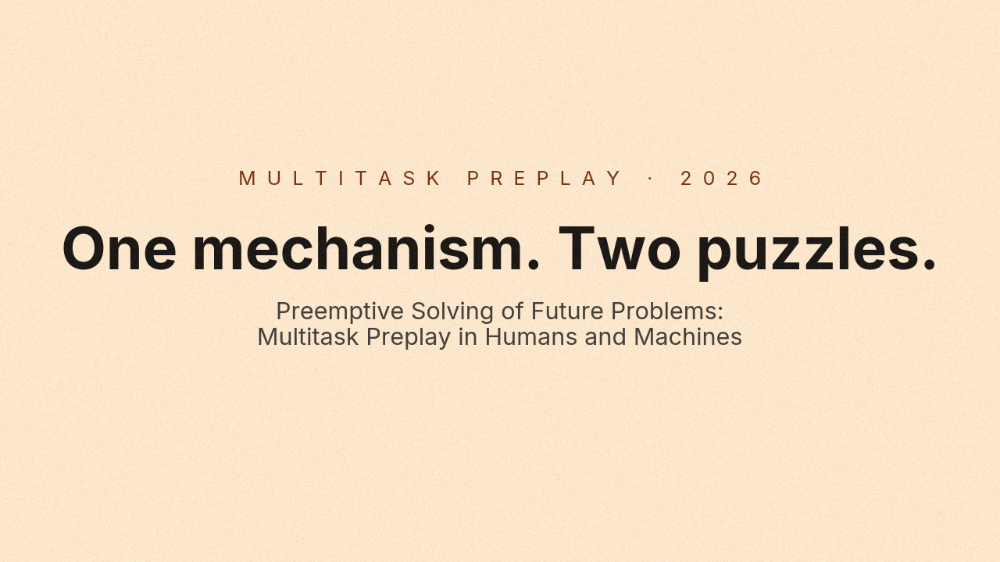

In [111]:
# Peek — one frame, no encode. Re-run after editing m.STORYBOARD["title"]
# or swapping themes. Renders in <1s.
display(_PILImage.fromarray(m.peek_title(opening=True)))


In [74]:
# Title (opening) — full block, encoded to _block_title.mp4
FPS=3
title_open = m.build_title_block(opening=True, fps=FPS)
out = m.preview_block(title_open, "title", fps=FPS)
Video(str(out), embed=True, width=720)


[rawvideo @ 0x155f19f80] Stream #0: not enough frames to estimate rate; consider increasing probesize


  wrote /Users/wilka/git/projects/multitask_preplay/plots/output/make_promo_video/_block_title.mp4


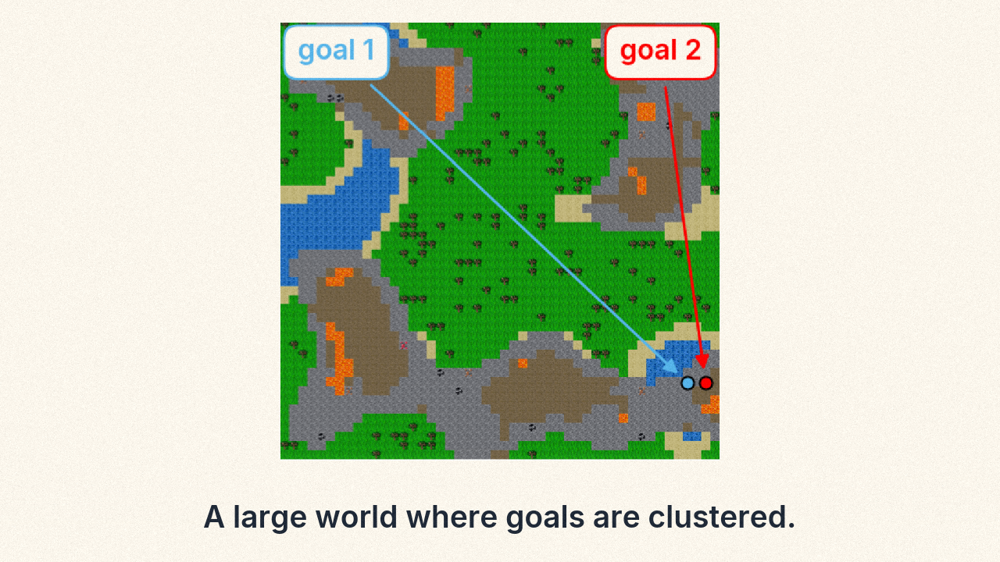

In [118]:
# Peek — one frame of the establishing shot, no encode.
display(_PILImage.fromarray(m.peek_panel0(bundle, train)))


In [112]:
# Panel 0 — establishing shot. Reveals map → +blue ball → +red ball, 2s each.
FPS=20
panel0 = m.build_panel0_block(bundle, train, fps=FPS)
out = m.preview_block(panel0, "panel0", fps=FPS)
Video(str(out), embed=True, width=720)


  wrote /Users/wilka/git/projects/multitask_preplay/plots/output/make_promo_video/_block_panel0.mp4  (120 unique frames @ effective 20 fps, container 20 fps)


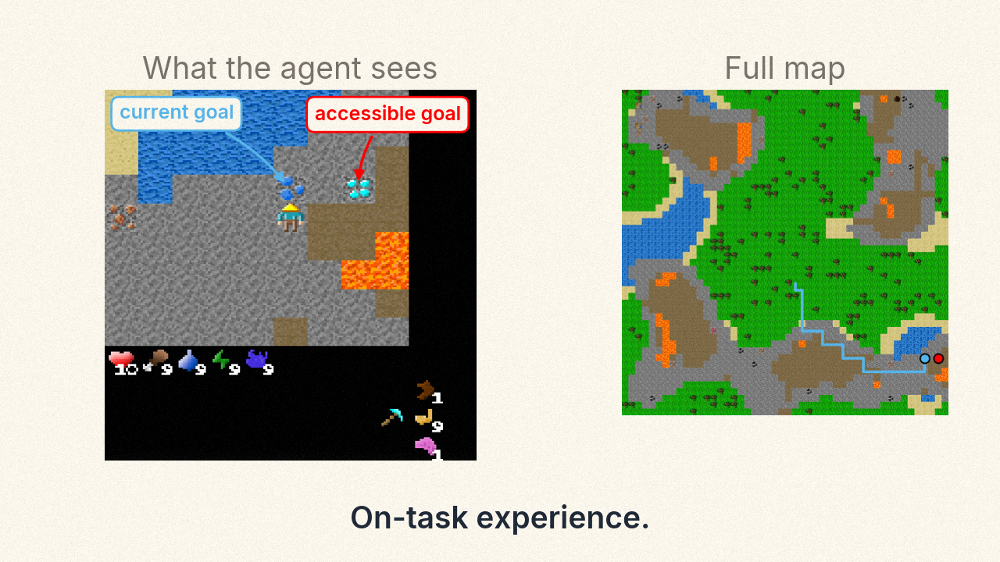

In [119]:
# Peek — one mid-rollout frame of the on-task train beat.
display(_PILImage.fromarray(m.peek_panel1(bundle, train)))


In [120]:
# Panel 1 — on-task train rollout, growing blue trail on the minimap.
FPS=2
panel1 = m.build_panel1_block(bundle, train, fps=FPS)
out = m.preview_block(panel1, "panel1", fps=FPS)
Video(str(out), embed=True, width=720)


  wrote /Users/wilka/git/projects/multitask_preplay/plots/output/make_promo_video/_block_panel1.mp4  (42 unique frames @ effective 2 fps, container 12 fps)


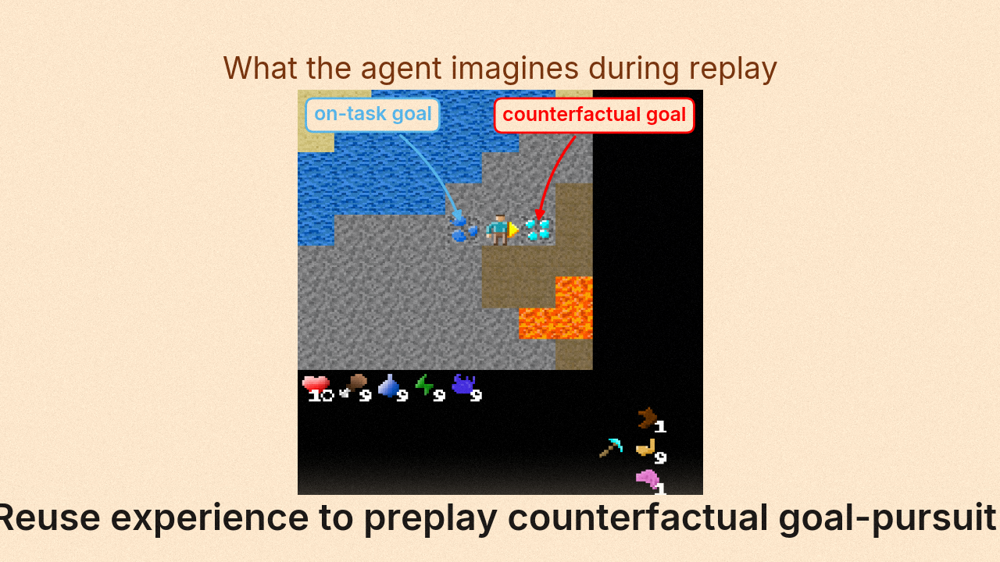

In [96]:
# # Peek — one mid-preplay frame: frozen partial view + partial dashed arrows.
# display(_PILImage.fromarray(m.peek_panel2(bundle, train, preplay)))


In [114]:
# Panel 2 — off-task preplay. Frozen partial view at the branch state,
# dashed amber arrows growing toward the off-task goal on the minimap.
FPS=2
panel2 = m.build_panel2_block(bundle, train, preplay, fps=FPS)
out = m.preview_block(panel2, "panel2", fps=FPS)
Video(str(out), embed=True, width=720)


  wrote /Users/wilka/git/projects/multitask_preplay/plots/output/make_promo_video/_block_panel2.mp4  (21 unique frames @ effective 2 fps, container 12 fps)


In [115]:
# # Peek — one mid-rollout frame of the test beat.
# display(_PILImage.fromarray(m.peek_panel3(bundle, train, test)))


In [116]:
# Panel 3 — test rollout. Pale full train history + growing amber test trail.
FPS=5
panel3 = m.build_panel3_block(bundle, train, test, fps=FPS)
out = m.preview_block(panel3, "panel3", fps=FPS)
Video(str(out), embed=True, width=720)


  wrote /Users/wilka/git/projects/multitask_preplay/plots/output/make_promo_video/_block_panel3.mp4  (52 unique frames @ effective 5 fps, container 10 fps)


In [86]:
# Optional — inspect a single crossfade join (e.g. panel1 -> panel2)
# without rendering the whole storyboard. Tuple form repeats each block to
# encode_fps so mixed-fps panels concat without playback drift.
out = m.preview_bridge(
    [(panel1, m.STORYBOARD["panel1"]["fps"]),
     (panel2, m.STORYBOARD["panel2"]["fps"])],
    "p1_to_p2",
)
Video(str(out), embed=True, width=720)


  wrote /Users/wilka/git/projects/multitask_preplay/plots/output/make_promo_video/_bridge_p1_to_p2.mp4  (390 unique frames @ effective 20 fps, container 20 fps)


---
## 5 · Compose the full storyboard

Only run once each block above looks right.


In [ ]:
# Each panel builds at its own STORYBOARD["panelN"]["fps"]; the orchestrator
# repeats frames so the joined MP4 plays at one container framerate.
frames = m.render_full_storyboard(bundle, train, preplay, test)
encode_fps = m.STORYBOARD["encode_fps"]
print(f'{len(frames)} frames @ {encode_fps} fps '
      f'=> {len(frames) / encode_fps:.2f}s, shape {frames[0].shape}')


In [ ]:
# # Frame grid — catch visual bugs (rings, trail colors, dashed vs solid, caption clipped).
# import matplotlib.pyplot as plt

# N = len(frames)
# sample_idx = [0, N // 6, 2 * N // 6, N // 2, 4 * N // 6, 5 * N // 6, N - 1]
# fig, axes = plt.subplots(1, len(sample_idx), figsize=(22, 3))
# for ax, i in zip(axes, sample_idx):
#     ax.imshow(frames[i])
#     ax.set_title(f't={i / 20:.2f}s')
#     ax.axis('off')
# plt.tight_layout()
# plt.show()

In [ ]:
# Encode MP4 + GIF at the storyboard's container framerate.
mp4_path = m.OUTPUT_DIR / 'make_promo_video_craftax.mp4'
gif_path = m.OUTPUT_DIR / 'make_promo_video_craftax.gif' 
m.encode(frames, mp4_path, out_gif=gif_path, fps=m.STORYBOARD["encode_fps"])
Video(str(mp4_path), embed=True, width=800)


In [102]:
# # Loop-seam check: end-of-stream -> start-of-stream transition.
# HTML(f'''
# <video autoplay loop muted playsinline width="800">
#   <source src="{mp4_path.name}" type="video/mp4">
# </video>
# ''')